In [74]:
### automatically refresh the buffer
%load_ext autoreload
%autoreload 2

### solve the auto-complete issue

%config Completer.use_jedi = False
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

### lvl 2 setups (systerm)
import os
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap,LinearSegmentedColormap,BoundaryNorm
import matplotlib.dates as mdates
import geopandas as gpd
from shapely.geometry import Point
from datetime import datetime


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Aerosol related variables

In [99]:
ds_a = xr.open_mfdataset('/data/shared_data/ARM_data/ENA/enarlproffex1thorC1/enarlproffex1thorC1.c0.201702*.custom.nc')

# Feature_Mask

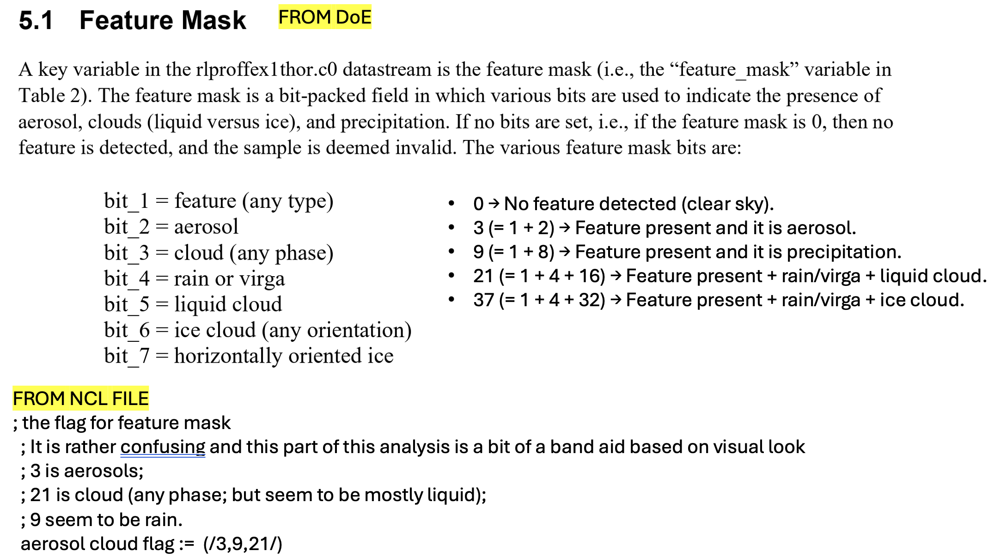

### feature_mask configration

In [100]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.ticker import NullFormatter

# ====== configuration ======
var_name = "feature_mask"
hcoord   = "height_high"
month    = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

# classes for feature_mask
classes = np.array([0, 3, 9, 21, 37], dtype=float)
classes.sort()
mid = (classes[:-1] + classes[1:]) / 2.0
bounds = np.concatenate((
    [classes[0] - (classes[1] - classes[0]) / 2.0],
    mid,
    [classes[-1] + (classes[-1] - classes[-2]) / 2.0]
))

cmap = ListedColormap(['#FFFFFF', '#7F0400', '#EFFF10', '#0F008F', '#7b2cbf'])
norm = BoundaryNorm(bounds, cmap.N, clip=True)

# ====== helper function ======
def edges_from_centers(x):
    x = np.asarray(x, dtype=float)
    if x.size == 1:
        dx = 0.5
        return np.array([x[0] - dx, x[0] + dx])
    dx = np.diff(x)
    return np.concatenate(([x[0] - dx[0]/2], (x[:-1] + x[1:]) / 2, [x[-1] + dx[-1]/2]))

# ====== select height and month ======
ds_mon = ds_a.sel({hcoord: slice(hmin_km, hmax_km)}).sel(
    time=slice(f"{month}-01", f"{month}-28T23:59:59")
)
da = ds_mon[var_name]  # DataArray with dims (time, height_high)

# days in the month
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")



### feature_mask plot

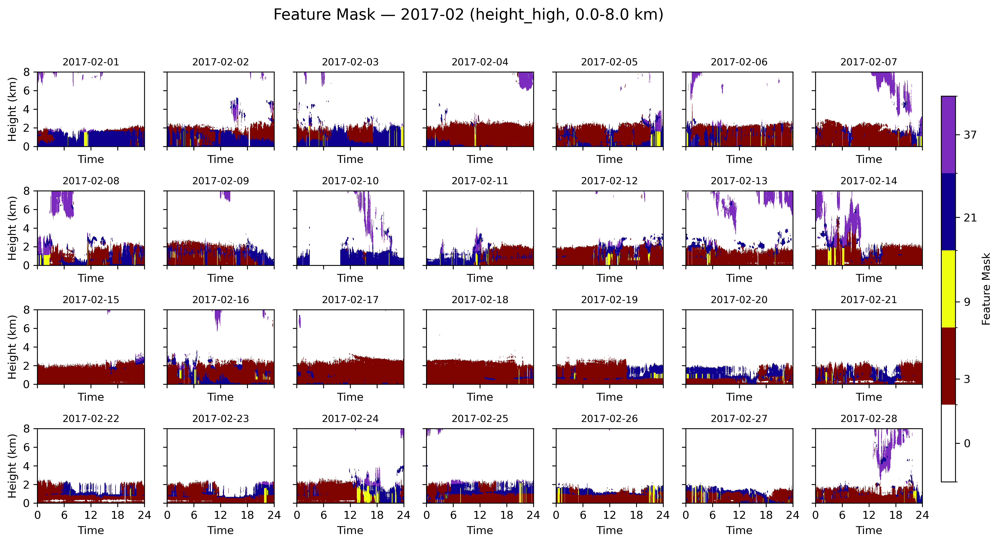

In [80]:
# ====== plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()


        
last_img = None
for i, day in enumerate(days):
    ax = axes[i]
    da_day = da.sel(time=slice(str(day.date()), str(day.date()) + "T23:59:59"))
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    t = pd.to_datetime(da_day.time.values)
    t_idx = pd.DatetimeIndex(t)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0  # float array
    x_edges = edges_from_centers(hours)

    zvals  = da_day.coords[hcoord].values
    y_edges = edges_from_centers(zvals)


    Z = da_day.transpose("time", hcoord).values.T

    img = ax.pcolormesh(x_edges, y_edges, Z, cmap=cmap, norm=norm,
                        shading='auto', rasterized=True)
    last_img = img  

    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)
    ax.set_xticks(np.arange(0, 25, 6))
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")

tick_locs = classes  
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  
cbar = fig.colorbar(last_img, cax=cax, ticks=tick_locs)
cbar.set_label("Feature Mask")
cbar.ax.tick_params(length=4, width=0.8)

fig.suptitle(f"Feature Mask — {month} (height_high, {hmin_km}-{hmax_km} km)", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Dust Fraction / Dust and Non-Dust Extinction / AOD / Dust AOD

Varible for calculate Dust Fraction:
- feature_mask
- depolarization_ratio
- extinction_be
- scattering_ratio_e

In [114]:
# =====month and height=======
month = "2017-02"
hmin_km, hmax_km = 0.03, 8.0

ds_mon = ds_a.sel(
    height_high=slice(hmin_km, hmax_km),
    time=slice(f"{month}-01", f"{month}-28T23:59:59")
)

# parameter
valid_classes = [3, 9, 21, 37]   
aerosol_class = 3
cloud_class = 21

dep_m  = 0.0049
dep_d  = 0.31
dep_nd = 0.15
T_K_WARM = 273.15

# ====================== QC ======================
mask_qc = (ds_mon["detection_confidence_score_total"] >= 0.3) & (ds_mon["qc_profile"] == 0)

feature_mask = ds_mon["feature_mask"].where(mask_qc)
pdr_meas     = ds_mon["depolarization_ratio"].where(mask_qc)
ext          = ds_mon["extinction_be"].where(mask_qc)
sca          = ds_mon["scattering_ratio_e"].where(mask_qc)
temp_qc      = ds_mon["temperature"].where(mask_qc)

# ====================== keep valid class ======================
mask_class = xr.zeros_like(feature_mask, dtype=bool)
for val in valid_classes:
    mask_class = mask_class | (feature_mask == val)

feature_mask = feature_mask.where(mask_class)
pdr_meas     = pdr_meas.where(mask_class)
ext          = ext.where(mask_class)
sca          = sca.where(mask_class)
temp_qc      = temp_qc.where(mask_class)  

# ====================== height limitation > 30 m ======================
mask_height = (ds_mon["height_high"] >= hmin_km) & (ds_mon["height_high"] <= hmax_km)
feature_mask = feature_mask.where(mask_height)
pdr_meas     = pdr_meas.where(mask_height)
ext          = ext.where(mask_height)
sca          = sca.where(mask_height)
temp_qc      = temp_qc.where(mask_height)

# ====================== aerosol-only mask ======================
aerosol_mask = feature_mask == aerosol_class
pdr_meas_aerosol = pdr_meas.where(aerosol_mask)
sca_aerosol      = sca.where(aerosol_mask)
ext_aerosol      = ext.where(aerosol_mask)

# ====================== cloud-only mask and cloud extinction ======================
cloud_mask_warm = (feature_mask == cloud_class) & (temp_qc >= T_K_WARM)
ext_cloud = ext.where(cloud_mask_warm)                 
ext_cloud = ext_cloud.where(ext_cloud > 0)                  

# ====================== calculate PDR ======================
tepo = sca_aerosol + (sca_aerosol * dep_m) - dep_m
xnum = tepo * pdr_meas_aerosol - dep_m
xden = sca_aerosol - 1 + (sca_aerosol * dep_m) - pdr_meas_aerosol
pdr = xnum / xden

# ====================== calculate dust fraction ======================
dust_frac = ((pdr - dep_nd) * (1 + dep_d)) / ((dep_d - dep_nd) * (1 + pdr))
dust_frac = dust_frac.where(pdr < dep_d, 1.0)
dust_frac = dust_frac.where(pdr > dep_nd, 0.0)
dust_frac = dust_frac.where(aerosol_mask)

# ====================== dust / non-dust extinction ======================
ext_dust    = (dust_frac * ext_aerosol).where(lambda v: v > 0)      
ext_nondust = ((1 - dust_frac) * ext_aerosol).where(lambda v: v > 0)

# ====================== column AOD / COD ======================

ext_units = (ext.attrs.get("units","") or "").replace(" ","").lower()
if any(u in ext_units for u in ["m-1", "1/m", "m^-1", "/m"]):
    z_int = ds_mon["height_high"] * 1000.0   # m
else:
    z_int = ds_mon["height_high"]            # km

dz  = xr.concat([z_int.isel(height_high=0), z_int.diff("height_high")], dim="height_high")
dz2d = xr.DataArray(dz, dims=["height_high"], coords={"height_high": ds_mon["height_high"]}).broadcast_like(ext)

ext_aero = ext.where(aerosol_mask)
AOD         = (ext_aero.clip(min=0) * dz2d).sum(dim="height_high")
dust_AOD    = (ext_dust * dz2d).sum(dim="height_high")
nondust_AOD = (ext_nondust * dz2d).sum(dim="height_high")

COD = (ext_cloud * dz2d).sum(dim="height_high")



### Dust fraction plot
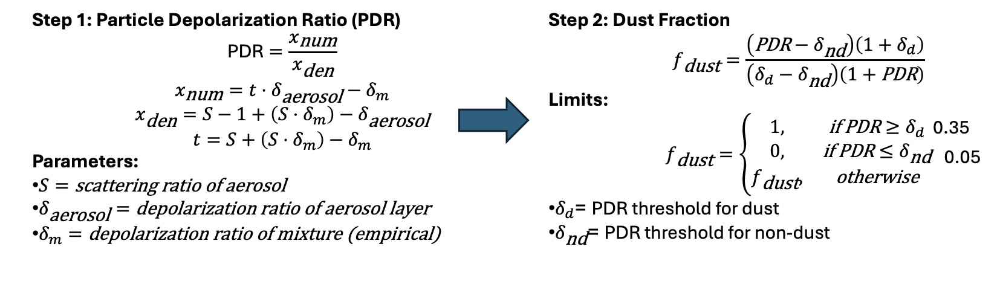

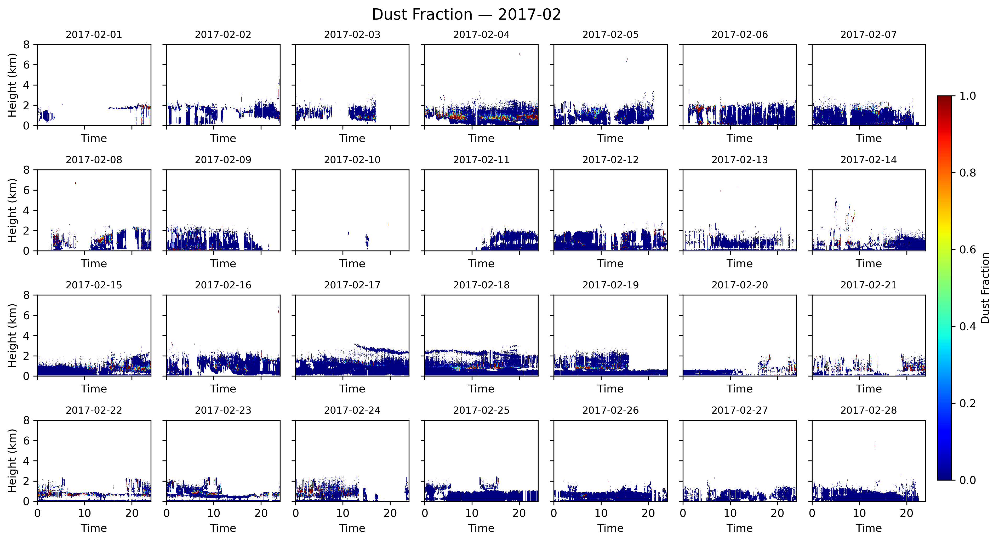

In [82]:
# ====== parameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = dust_frac[hcoord].values
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate(([height[0] - (height[1]-height[0])/2], z_edges, [height[-1] + (height[-1]-height[-2])/2]))

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    da_day = dust_frac.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    t = pd.to_datetime(da_day.time.values)
    t_idx = pd.DatetimeIndex(t)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate(([hours[0] - (hours[1]-hours[0])/2], x_edges, [hours[-1] + (hours[-1]-hours[-2])/2]))

    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(x_edges, z_edges, Z, cmap="jet", vmin=0, vmax=1, shading="auto")  # 连续色条
    ax.set_title(day.strftime("%m-%d"), fontsize=8)
    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)
# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  
cbar = fig.colorbar(img, cax=cax)
cbar.set_label("Dust Fraction")
plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Dust Fraction — {month}", fontsize=14)
plt.show()


### Total extinction, Dust and non-Dust extinction
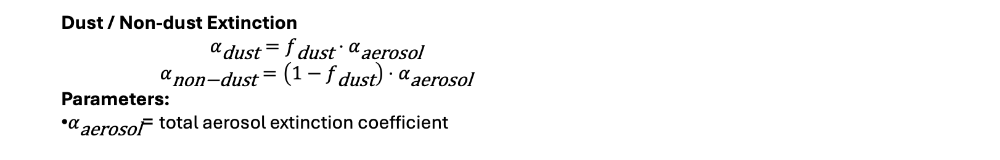

#### Total Extinction

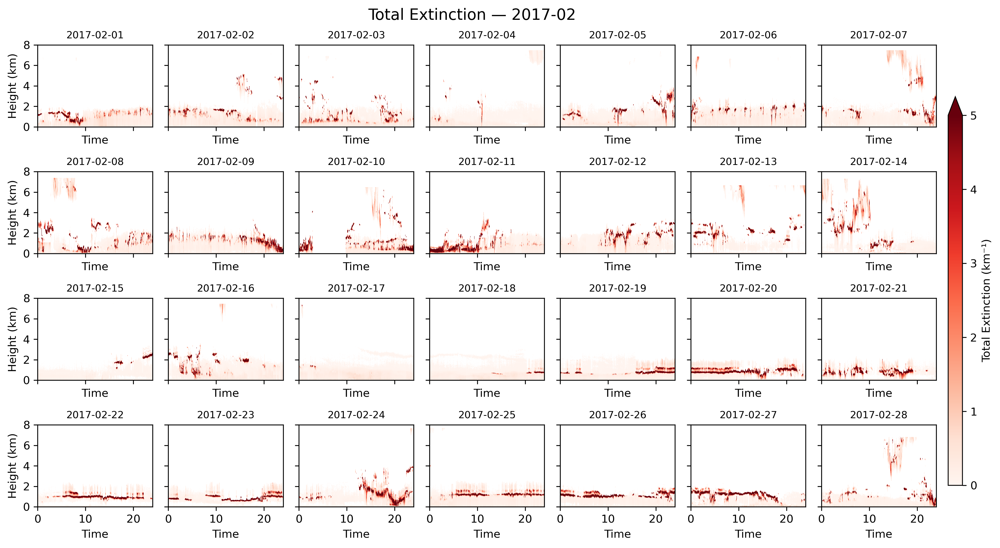

In [83]:
# ====== patameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = ext[hcoord].values  # 使用总 extinction
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate((
    [height[0] - (height[1]-height[0])/2],
    z_edges,
    [height[-1] + (height[-1]-height[-2])/2]
))

# ====== plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    da_day = ext.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    t = pd.to_datetime(da_day.time.values)
    t_idx = pd.DatetimeIndex(t)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate((
        [hours[0] - (hours[1]-hours[0])/2],
        x_edges,
        [hours[-1] + (hours[-1]-hours[-2])/2]
    ))

    # 绘制总 extinction
    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(
        x_edges, z_edges, Z,
        cmap="Reds", shading="auto",
        vmin=0, vmax=5  # 
    )
    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  
cbar = fig.colorbar(img, cax=cax, extend='max')


cbar.set_ticks([0, 1, 2, 3, 4 , 5,])
cbar.set_label("Total Extinction (km⁻¹)")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Total Extinction — {month}", fontsize=14)
plt.show()



#### Dust Extinction

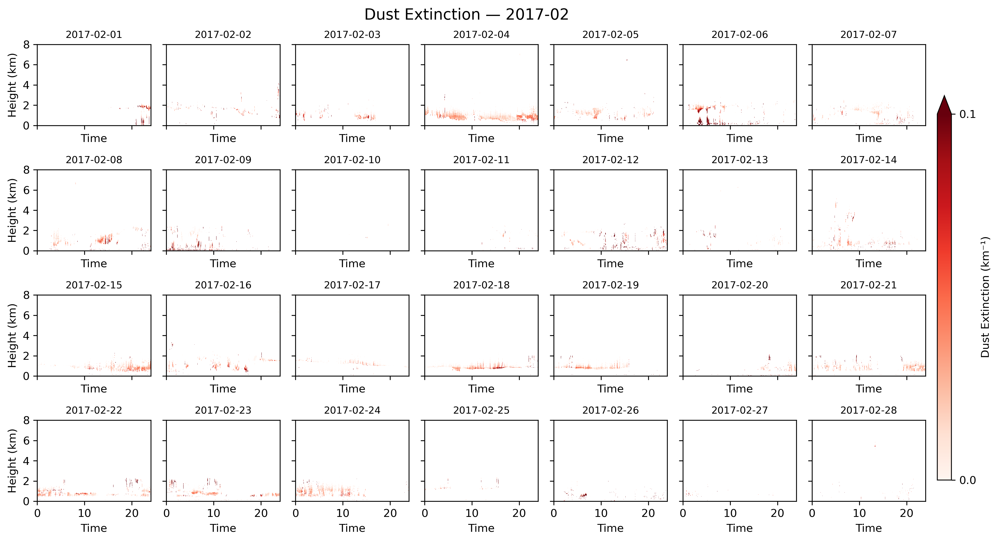

In [84]:
# ====== patameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = ext_dust[hcoord].values  # 使用 dust extinction
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate(([height[0] - (height[1]-height[0])/2], z_edges, 
                          [height[-1] + (height[-1]-height[-2])/2]))

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    da_day = ext_dust.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    # 横轴小时
    t = pd.to_datetime(da_day.time.values)
    t_idx = pd.DatetimeIndex(t)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate(([hours[0] - (hours[1]-hours[0])/2], x_edges, 
                              [hours[-1] + (hours[-1]-hours[-2])/2]))


    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(x_edges, z_edges, Z, cmap="Reds", shading="auto", vmin=0, vmax=0.1)  # 连续色条
    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  
cbar = fig.colorbar(img, cax=cax, extend='max')


cbar.set_ticks([0, 0.1,])
cbar.set_label("Dust Extinction (km⁻¹)")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Dust Extinction — {month}", fontsize=14)
plt.show()


#### Non-Dust Extinction

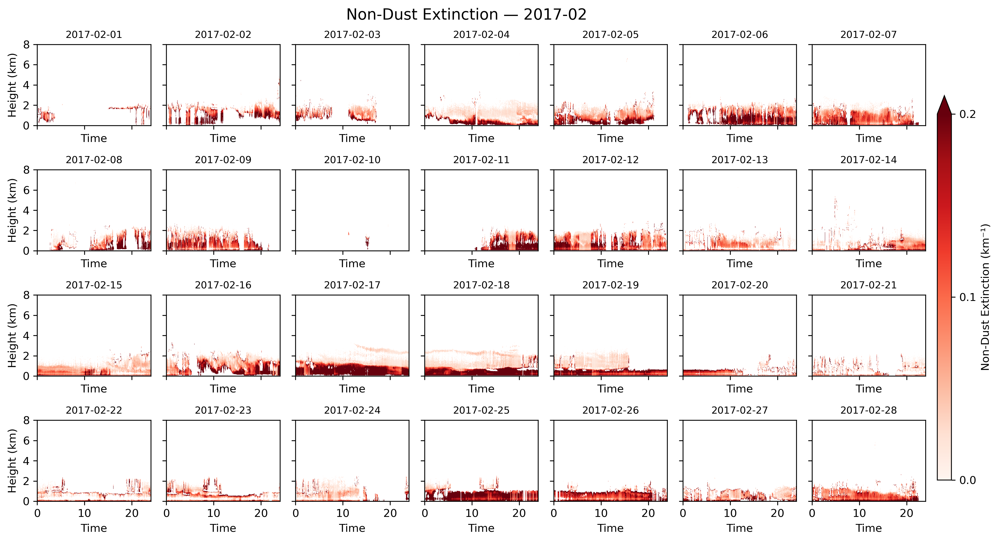

In [85]:
# ====== patameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = ext_nondust[hcoord].values  
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate(([height[0] - (height[1]-height[0])/2], z_edges, 
                          [height[-1] + (height[-1]-height[-2])/2]))

# ====== PLot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    da_day = ext_nondust.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue


    t = pd.to_datetime(da_day.time.values)
    t_idx = pd.DatetimeIndex(t)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate(([hours[0] - (hours[1]-hours[0])/2], x_edges, 
                              [hours[-1] + (hours[-1]-hours[-2])/2]))

    # non-dust extinction
    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(x_edges, z_edges, Z, cmap="Reds", shading="auto", vmin=0, vmax=0.2)  # 连续色条
    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  
cbar = fig.colorbar(img, cax=cax, extend='max')


cbar.set_ticks([0, 0.1, 0.2,])
cbar.set_label("Non-Dust Extinction (km⁻¹)")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Non-Dust Extinction — {month}", fontsize=14)
plt.show()


### AOD and Dust AOD
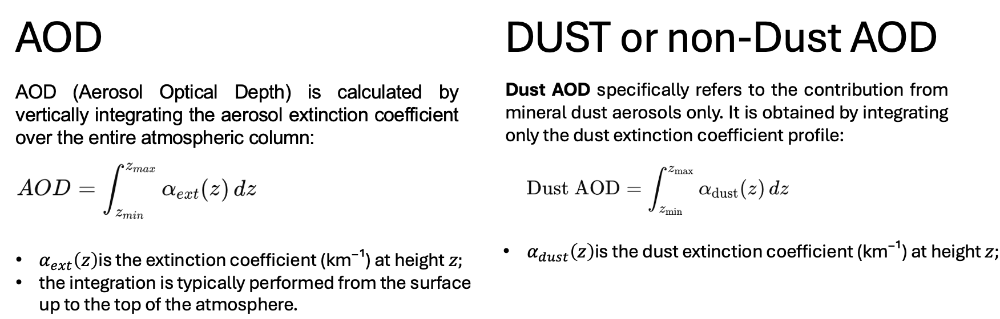

#### AOD

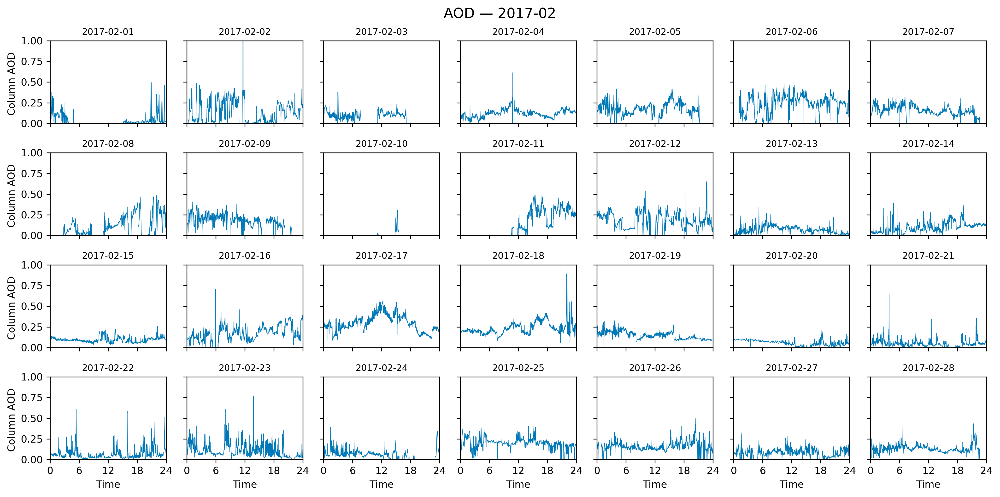

In [89]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    t0, t1 = pd.Timestamp(day), pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    aod_day = AOD.sel(time=slice(str(t0), str(t1)))

    if aod_day.time.size == 0:
        ax.set_visible(False)
        continue

    # hourly time series
    t_idx = pd.DatetimeIndex(aod_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, aod_day.values, lw=0.5, color="#0077b6")

    ax.set_xlim(0, 24)

    ax.set_ylim(0, 1)

    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("Column AOD ")
    if i // 7 == 3:
        ax.set_xlabel("Time")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"AOD — {month}", fontsize=14)
plt.show()


#### Dust AOD

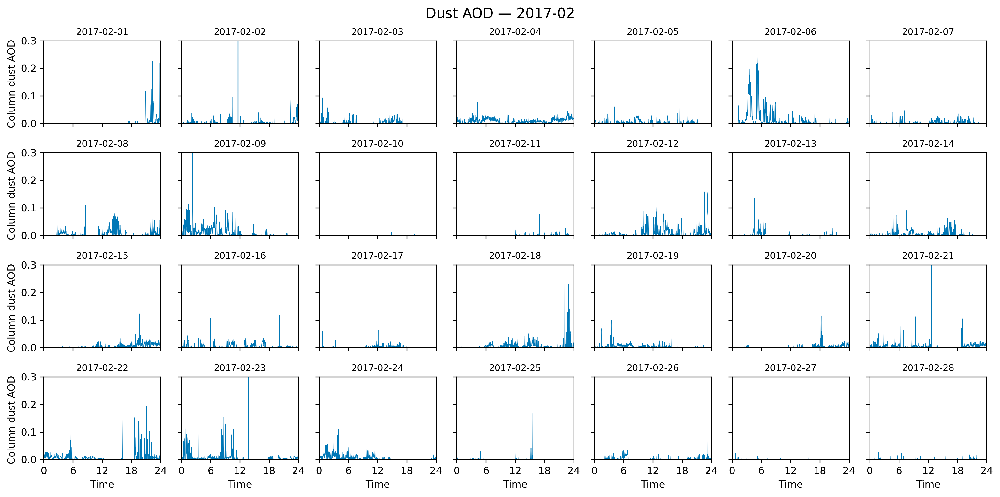

In [90]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    t0, t1 = pd.Timestamp(day), pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    aod_day = dust_AOD.sel(time=slice(str(t0), str(t1)))

    if aod_day.time.size == 0:
        ax.set_visible(False)
        continue

    # hourly time series
    t_idx = pd.DatetimeIndex(aod_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, aod_day.values, lw=0.5, color="#0077b6")

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 0.3)

    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("Column dust AOD ")
    if i // 7 == 3:
        ax.set_xlabel("Time")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Dust AOD — {month}", fontsize=14)
plt.show()

#### non-Dust AOD

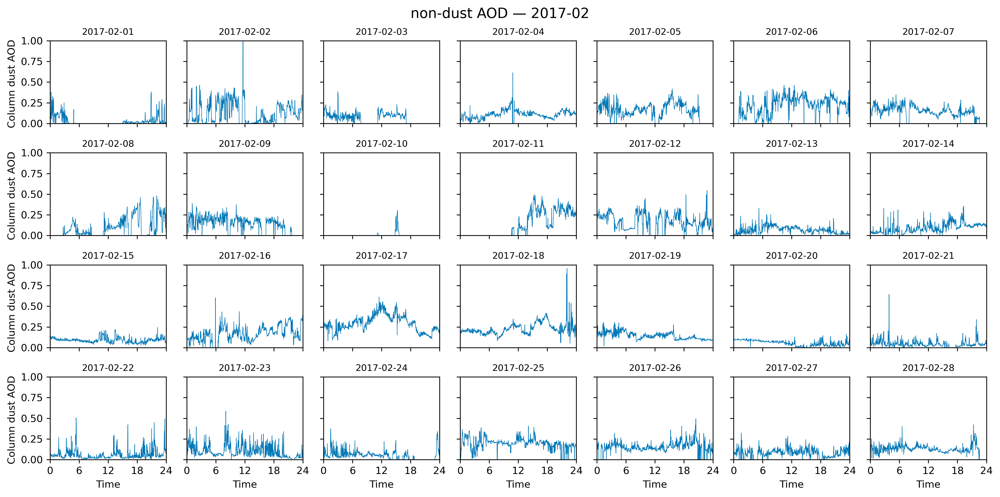

In [91]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    t0, t1 = pd.Timestamp(day), pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    aod_day = nondust_AOD.sel(time=slice(str(t0), str(t1)))

    if aod_day.time.size == 0:
        ax.set_visible(False)
        continue

    # hourly time series
    t_idx = pd.DatetimeIndex(aod_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, aod_day.values, lw=0.5, color="#0077b6")

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 1)

    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("Column dust AOD ")
    if i // 7 == 3:
        ax.set_xlabel("Time")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"non-dust AOD — {month}", fontsize=14)
plt.show()

# Cloud related variables

In [92]:
ds_c = xr.open_mfdataset('/data/shared_data/ARM_data/ENA/enamwrret2turnC1/enamwrret2turnC1.c1.201702*.nc')

In [93]:
month = "2017-02"
ds_mon = ds_c.sel(time=slice(f"{month}-01", f"{month}-28T23:59:59"))

#### Liquid Water Path

In [94]:
lwp = ds_mon["phys_lwp"]        
qc  = ds_mon["qc_phys_lwp"]   

lwp_qc = lwp.where(qc == 0)
lwp_s = lwp_qc.rolling(time=3, center=True, min_periods=1).mean()

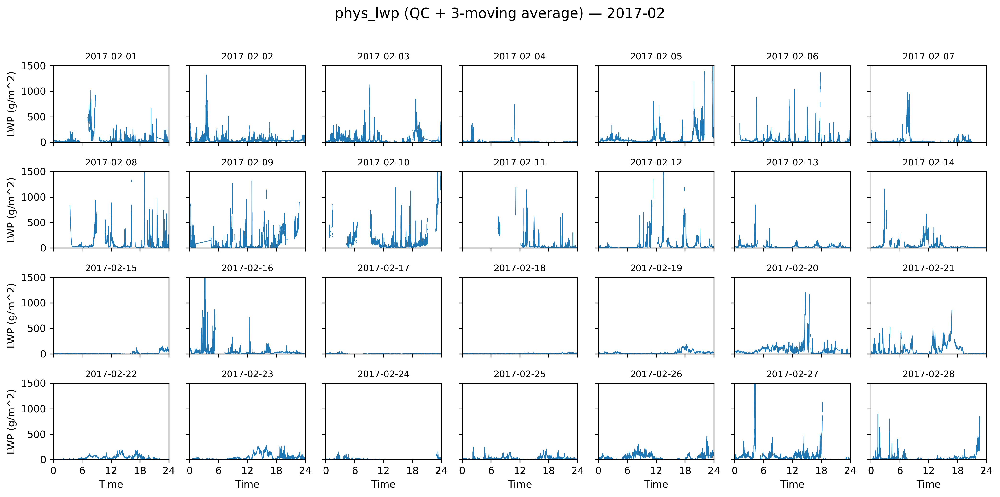

In [95]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    t0 = pd.Timestamp(day)
    t1 = t0 + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)

    lwp_day = lwp_s.sel(time=slice(str(t0), str(t1)))

    if lwp_day.time.size == 0:
        ax.set_visible(False)
        continue

    t_idx = pd.DatetimeIndex(lwp_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, lwp_day.values, lw=0.7)

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 1500)
    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel(f"LWP ({lwp_s.attrs.get('units','')})")
    if i // 7 == 3:
        ax.set_xlabel("Time")

fig.suptitle(f"phys_lwp (QC + 3-moving average) — {month}", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

#### Cloud Extinction

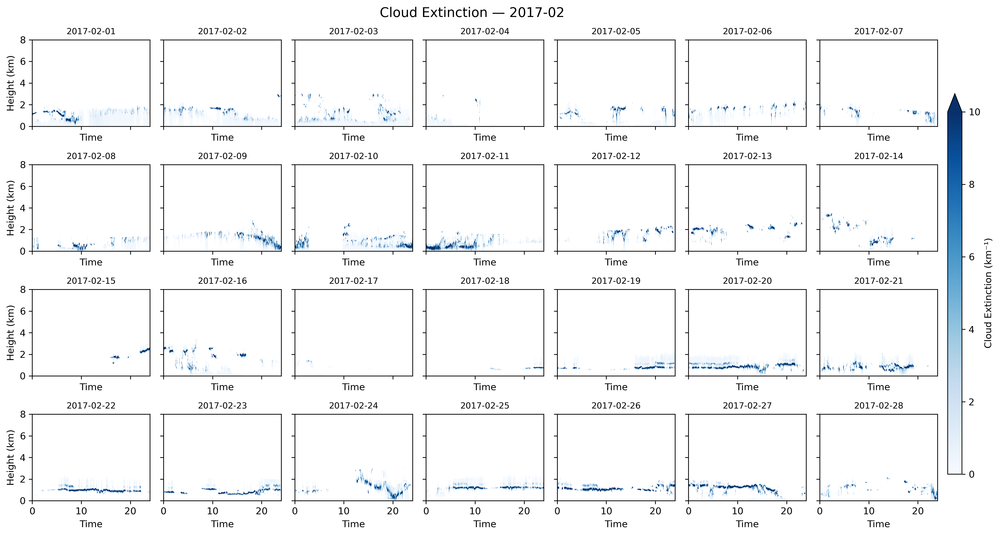

In [96]:
# ====== parameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

height = ext_cloud[hcoord].values
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate((
    [height[0] - (height[1]-height[0])/2],
    z_edges,
    [height[-1] + (height[-1]-height[-2])/2]
))

vmax_cloud = np.nanpercentile(ext_cloud.values, 99)
if not np.isfinite(vmax_cloud) or vmax_cloud <= 0:
    vmax_cloud = 1.0  
vmin_cloud = 0.0

# ====== plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 8), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    day_start = pd.Timestamp(day)
    day_end   = day_start + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)

    da_day = ext_cloud.sel(time=slice(str(day_start), str(day_end)))

    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    t_idx  = pd.DatetimeIndex(pd.to_datetime(da_day.time.values))
    hours  = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    if hours.size < 2:
        ax.set_visible(False)
        continue
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate((
        [hours[0] - (hours[1]-hours[0])/2],
        x_edges,
        [hours[-1] + (hours[-1]-hours[-2])/2]
    ))

    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(
        x_edges, z_edges, Z,
        cmap="Blues", shading="auto",
        vmin=0, vmax=10)

    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])
cbar = fig.colorbar(img, cax=cax, extend='max')
cbar.set_label("Cloud Extinction (km⁻¹)")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Cloud Extinction — {month}", fontsize=14)
plt.show()


#### COD

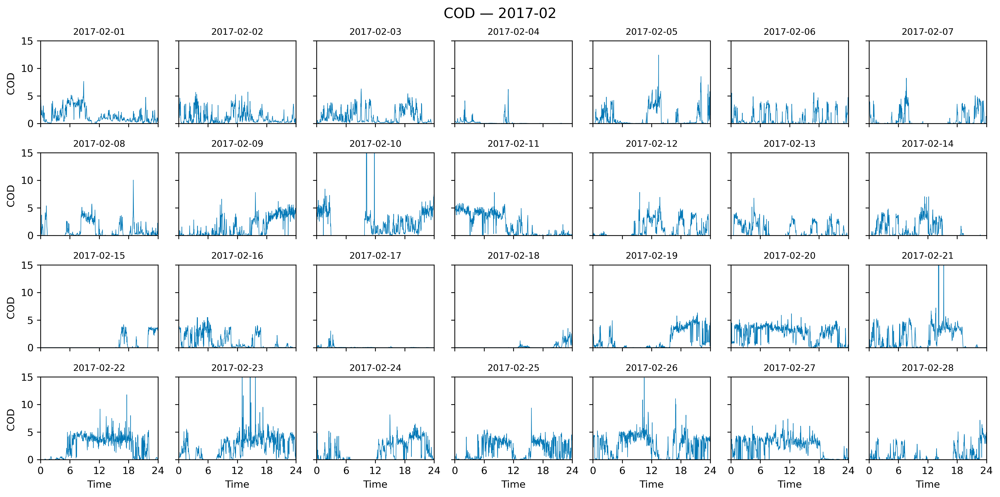

In [97]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    t0, t1 = pd.Timestamp(day), pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    aod_day = COD.sel(time=slice(str(t0), str(t1)))

    if aod_day.time.size == 0:
        ax.set_visible(False)
        continue

    # hourly time series
    t_idx = pd.DatetimeIndex(aod_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, aod_day.values, lw=0.5, color="#0077b6")

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 15)

    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("COD ")
    if i // 7 == 3:
        ax.set_xlabel("Time")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"COD — {month}", fontsize=14)
plt.show()

#### Linear Depolizaiton Ratio

In [115]:
vldr = ds_mon["depolarization_ratio"].where(mask_qc).where(mask_height)
vldr = vldr.where(mask_class)
vldr_s = vldr.rolling(time=3, center=True, min_periods=1).mean()

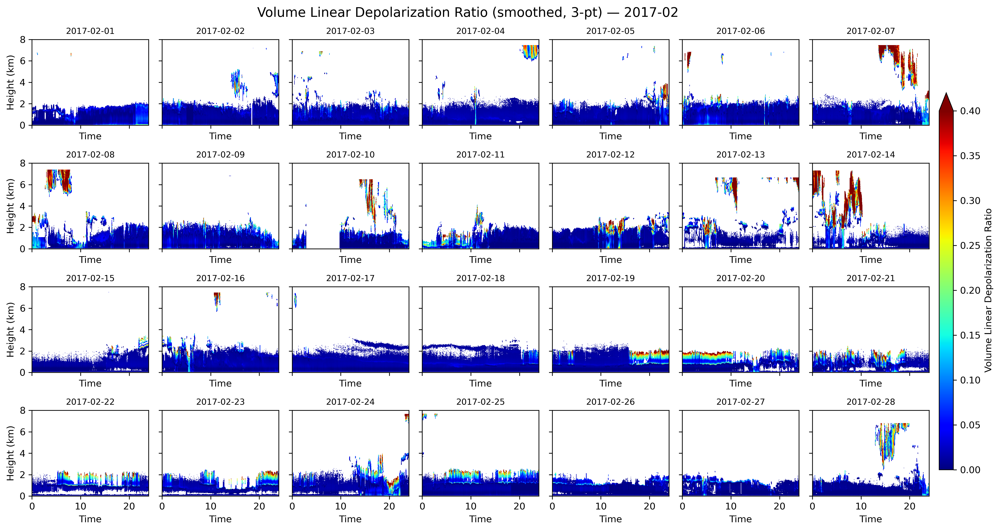

In [119]:
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

height = vldr_s[hcoord].values
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate(([height[0] - (height[1]-height[0])/2], z_edges,
                          [height[-1] + (height[-1]-height[-2])/2]))

vmax_vldr = np.nanpercentile(vldr_s.values, 99)
if not np.isfinite(vmax_vldr) or vmax_vldr <= 0:
    vmax_vldr = 0.4
vmin_vldr = 0.0

fig, axes = plt.subplots(4, 7, figsize=(14, 8), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    t0 = pd.Timestamp(day)
    t1 = t0 + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)

    da_day = vldr_s.sel(time=slice(str(t0), str(t1)))
    if da_day.time.size < 2:
        ax.set_visible(False)
        continue

    t_idx = pd.DatetimeIndex(pd.to_datetime(da_day.time.values))
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate(([hours[0] - (hours[1]-hours[0])/2], x_edges,
                              [hours[-1] + (hours[-1]-hours[-2])/2]))

    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(x_edges, z_edges, Z, cmap="jet",
                        shading="auto", vmin=0, vmax=0.4)

    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# colorbar
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])
cbar = fig.colorbar(img, cax=cax, extend='max')
cbar.set_label("Volume Linear Depolarization Ratio")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Volume Linear Depolarization Ratio (smoothed, 3-pt) — {month}", fontsize=14)
plt.show()
